In [1]:
## load the libraries 
import sys
import warnings
import os
import glob
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import cv2
from sklearn.model_selection import train_test_split

from keras.layers import *
from keras.callbacks import EarlyStopping
from keras.utils import to_categorical
from keras.models import Model, Sequential
from keras.metrics import *
from keras.optimizers import Adam, RMSprop
from scipy.stats import norm
from keras.preprocessing import image
from keras import datasets

from keras import backend as K
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.gray()

Using TensorFlow backend.


In [2]:
def load_image(path):
    x_size = 28
    y_size = 28
    image_list = np.zeros((len(path), x_size, y_size, 1))
    for i, fig in enumerate(path):
        img = image.load_img(fig, color_mode='grayscale', target_size=(x_size, y_size))
        x = image.img_to_array(img).astype('float32')
        x = x / 255.0
        image_list[i] = x
    
    return image_list

In [3]:
train_img = glob.glob("train/*.png")


test_img = glob.glob("test/*.png")


random.shuffle(train_img)
random.shuffle(test_img)

x_train = load_image(train_img)


x_test = load_image(test_img) 

In [4]:
y_test = []

for img in test_img:
    if "Calcific" in img:
        y_test.append(0)
    elif "Fibrous" in img:
        y_test.append(1)

In [5]:
batch_size = 128
epochs = 20
inChannel = 1
x, y = 28, 28
input_img = Input(shape = (x, y, inChannel))
print(input_img.shape)

(?, 28, 28, 1)


In [6]:
# input layer
input_layer = Input(shape=(x, y, inChannel))

# encoding architecture
encoded_layer1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_layer)
encoded_layer1 = MaxPool2D( (2, 2), padding='same')(encoded_layer1)
encoded_layer2 = Conv2D(32, (3, 3), activation='relu', padding='same')(encoded_layer1)
encoded_layer2 = MaxPool2D( (2, 2), padding='same')(encoded_layer2)
encoded_layer3 = Conv2D(16, (3, 3), activation='relu', padding='same')(encoded_layer2)
encoded_layer4 = Conv2D(64, (3, 3), activation='sigmoid', padding='same')(encoded_layer3)
encoded_layer5 = Conv2D(16, (3, 3), activation='relu', padding='same')(encoded_layer4)
latent_view    = MaxPool2D( (2, 2), padding='same')(encoded_layer5)

Instructions for updating:
Colocations handled automatically by placer.


In [7]:
# decoding architecture
decoded_layer1 = Conv2D(16, (3, 3), activation='relu', padding='same')(latent_view)
decoded_layer1 = UpSampling2D((2, 2))(decoded_layer1)
decoded_layer2 = Conv2D(32, (3, 3), activation='relu', padding='same')(decoded_layer1)
decoded_layer2 = UpSampling2D((2, 2))(decoded_layer2)
decoded_layer3 = Conv2D(64, (3, 3), activation='relu')(decoded_layer2)
decoded_layer3 = UpSampling2D((2, 2))(decoded_layer3)
output_layer   = Conv2D(1, (3, 3), padding='same')(decoded_layer3)

In [39]:
# compile the model
model = Model(input_layer, output_layer)
model.compile(optimizer='adam', loss='mse') 
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 64)        640       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 32)        18464     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 7, 7, 32)          0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 7, 7, 16)          4624      
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 7, 7, 64)          9280      
__________

In [43]:
!pip install pydot

In [47]:
from IPython.display import SVG
from keras.utils import model_to_dot

SVG(model_to_dot(model).create(prog='dot', format='svg'))

ImportError: cannot import name 'model_to_dot' from 'keras.utils' (/home/webvalley/anaconda3/envs/plaque-img/lib/python3.7/site-packages/keras/utils/__init__.py)

In [10]:
#early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=5, mode='auto')
history = model.fit(x_train, x_train, epochs=epochs, batch_size=batch_size, validation_data=(x_test, x_test))#, callbacks=[early_stopping])

Instructions for updating:
Use tf.cast instead.
Train on 6981 samples, validate on 599 samples
Epoch 1/20
6981/6981 [==============================] - 12s 2ms/step - loss: 0.0110 - val_loss: 0.0054
Epoch 2/20
6981/6981 [==============================] - 12s 2ms/step - loss: 0.0045 - val_loss: 0.0036
Epoch 3/20
6981/6981 [==============================] - 12s 2ms/step - loss: 0.0037 - val_loss: 0.0033
Epoch 4/20
6981/6981 [==============================] - 12s 2ms/step - loss: 0.0033 - val_loss: 0.0029
Epoch 5/20
6981/6981 [==============================] - 12s 2ms/step - loss: 0.0030 - val_loss: 0.0027
Epoch 6/20
6981/6981 [==============================] - 12s 2ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 7/20
6981/6981 [==============================] - 12s 2ms/step - loss: 0.0026 - val_loss: 0.0024
Epoch 8/20
6981/6981 [==============================] - 12s 2ms/step - loss: 0.0025 - val_loss: 0.0023
Epoch 9/20
6981/6981 [==============================] - 12s 2ms/step - loss: 0.00

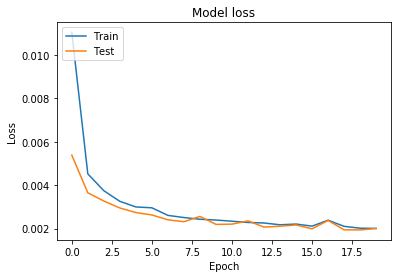

In [41]:

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [11]:
# compile the model
encoder = Model(input_layer, latent_view)
encoder.compile(optimizer='adam', loss='mse')

In [12]:
label_conv = {
    0: 'Calcific',
    1: 'Fibrous'
}

In [13]:
encoded_imgs = encoder.predict(x_train)
decoded_imgs = model.predict(x_train)

6981
Encoded 0  Label Calcific


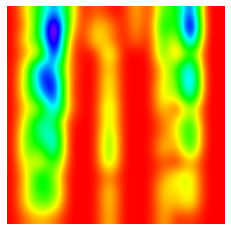

Encoded 1  Label Calcific


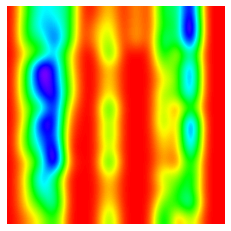

Encoded 2  Label Fibrous


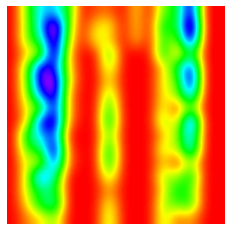

Encoded 3  Label Fibrous


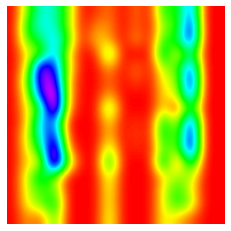

Encoded 4  Label Calcific


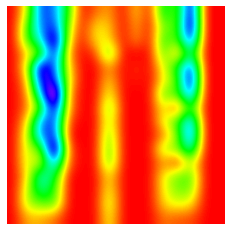

Encoded 5  Label Fibrous


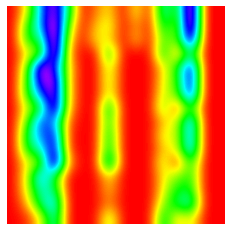

Encoded 6  Label Calcific


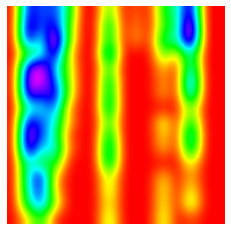

Encoded 7  Label Calcific


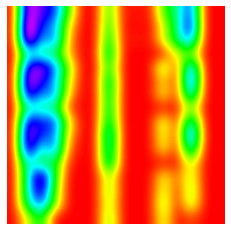

Encoded 8  Label Calcific


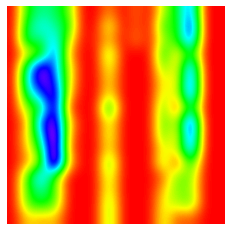

Encoded 9  Label Calcific


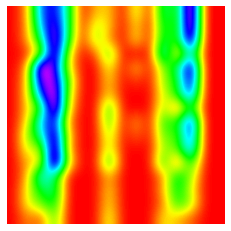

Encoded 10  Label Fibrous


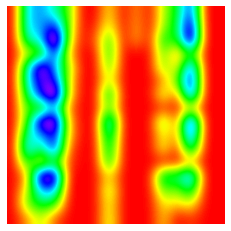

Encoded 11  Label Fibrous


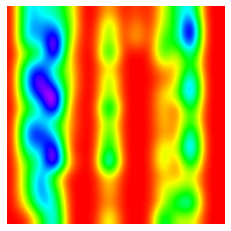

Encoded 12  Label Fibrous


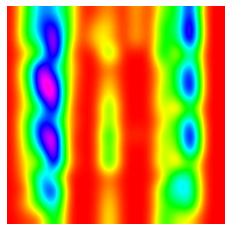

Encoded 13  Label Fibrous


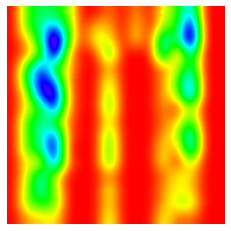

Encoded 14  Label Fibrous


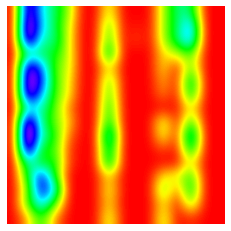

Encoded 15  Label Calcific


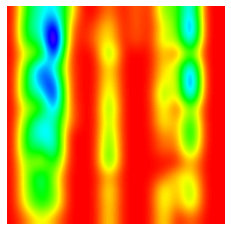

Encoded 16  Label Calcific


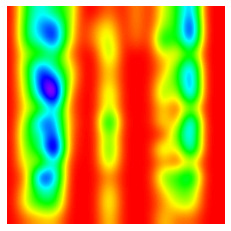

Encoded 17  Label Fibrous


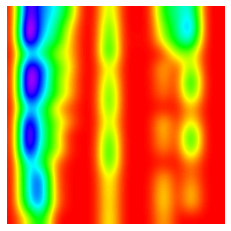

Encoded 18  Label Fibrous


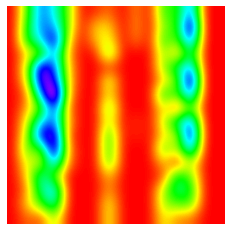

Encoded 19  Label Calcific


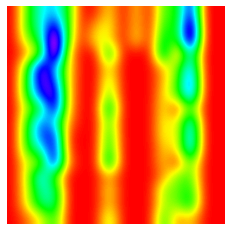

Encoded 20  Label Calcific


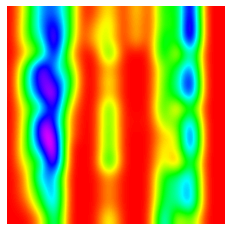

Encoded 21  Label Calcific


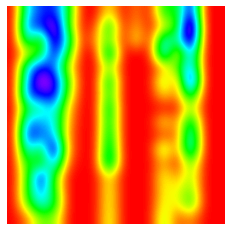

Encoded 22  Label Calcific


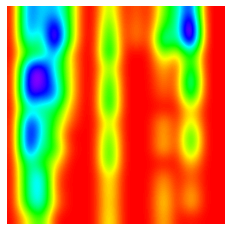

Encoded 23  Label Calcific


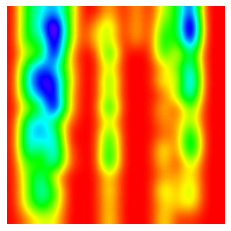

Encoded 24  Label Calcific


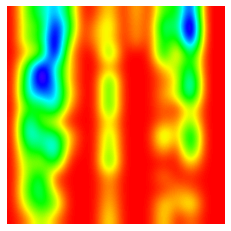

Encoded 25  Label Calcific


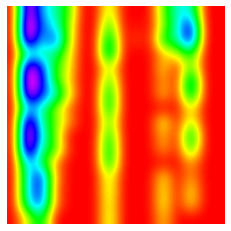

Encoded 26  Label Fibrous


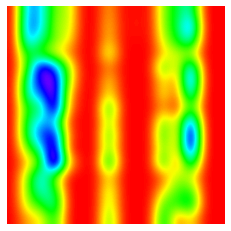

Encoded 27  Label Fibrous


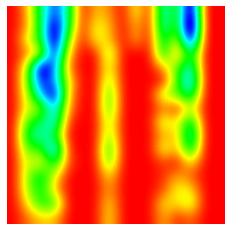

Encoded 28  Label Calcific


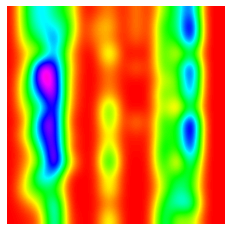

Encoded 29  Label Calcific


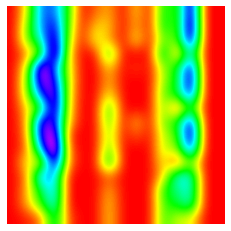

Encoded 30  Label Calcific


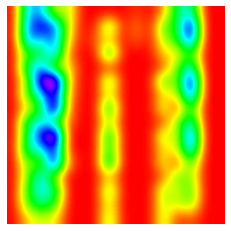

Encoded 31  Label Calcific


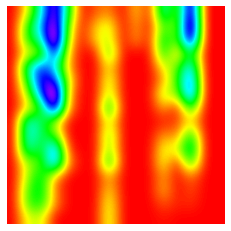

Encoded 32  Label Fibrous


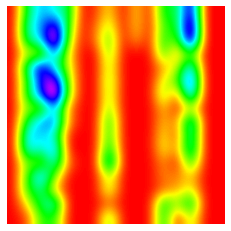

Encoded 33  Label Fibrous


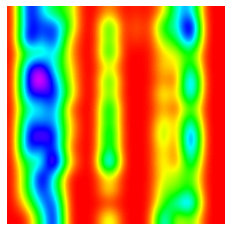

Encoded 34  Label Fibrous


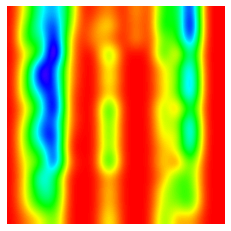

Encoded 35  Label Calcific


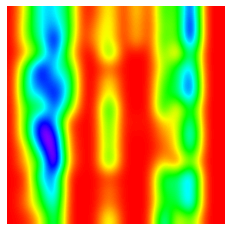

Encoded 36  Label Calcific


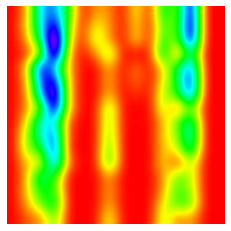

Encoded 37  Label Fibrous


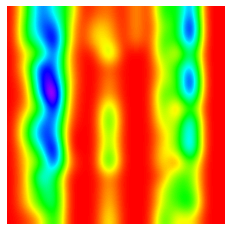

Encoded 38  Label Calcific


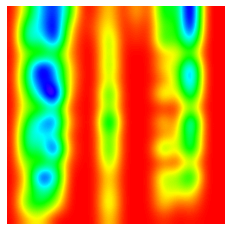

Encoded 39  Label Calcific


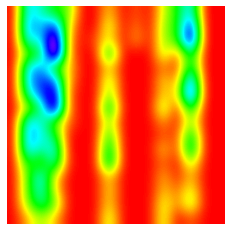

Encoded 40  Label Calcific


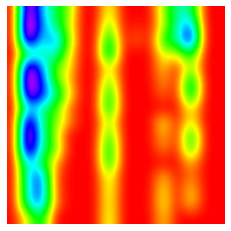

Encoded 41  Label Calcific


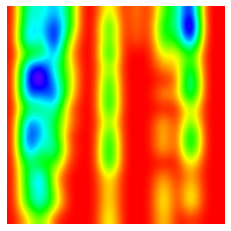

Encoded 42  Label Fibrous


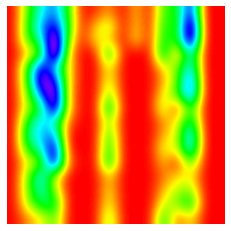

Encoded 43  Label Calcific


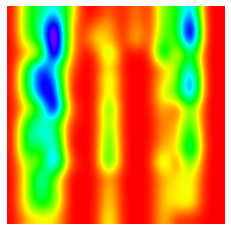

Encoded 44  Label Calcific


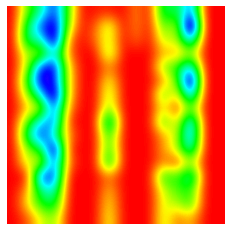

Encoded 45  Label Calcific


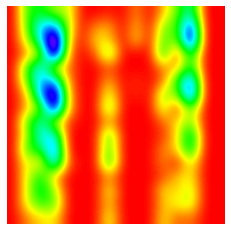

Encoded 46  Label Calcific


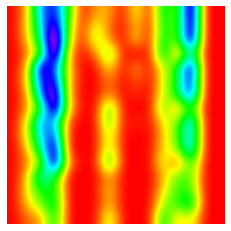

Encoded 47  Label Fibrous


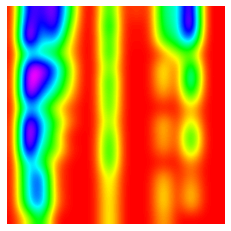

Encoded 48  Label Calcific


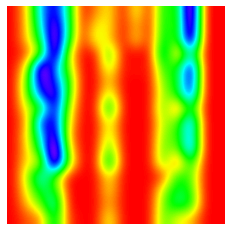

Encoded 49  Label Fibrous


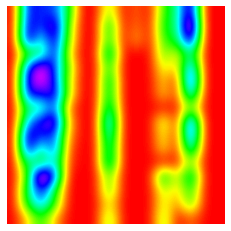

Encoded 50  Label Calcific


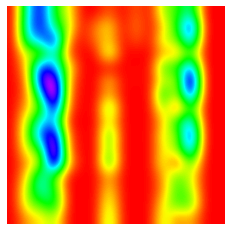

Encoded 51  Label Calcific


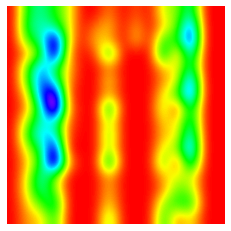

Encoded 52  Label Fibrous


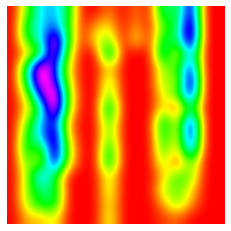

Encoded 53  Label Calcific


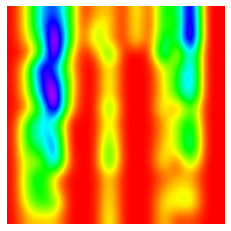

Encoded 54  Label Calcific


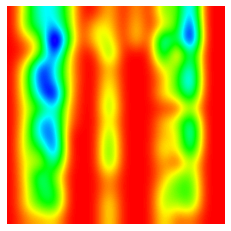

Encoded 55  Label Fibrous


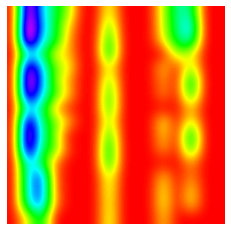

Encoded 56  Label Calcific


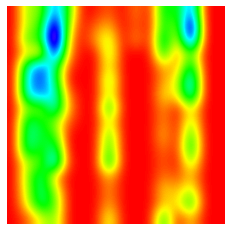

Encoded 57  Label Fibrous


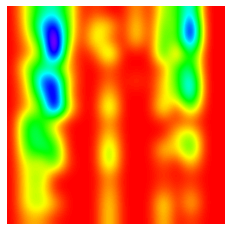

Encoded 58  Label Calcific


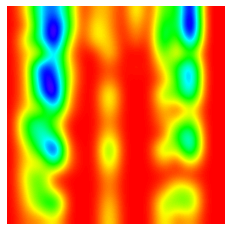

Encoded 59  Label Calcific


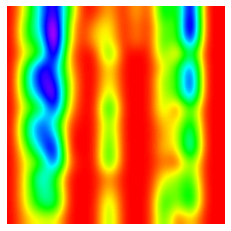

Encoded 60  Label Fibrous


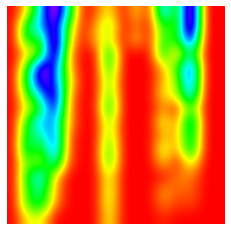

Encoded 61  Label Fibrous


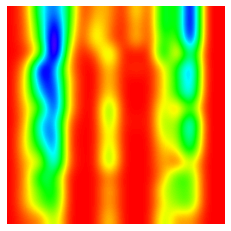

Encoded 62  Label Fibrous


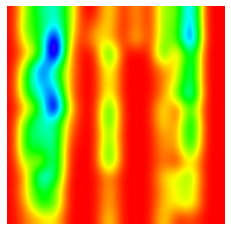

Encoded 63  Label Fibrous


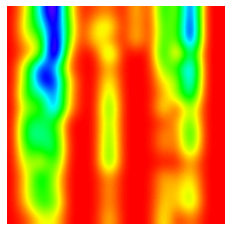

Encoded 64  Label Fibrous


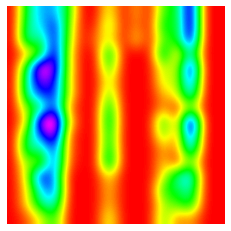

Encoded 65  Label Calcific


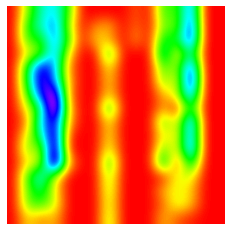

Encoded 66  Label Calcific


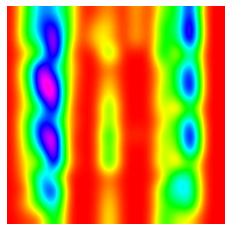

Encoded 67  Label Fibrous


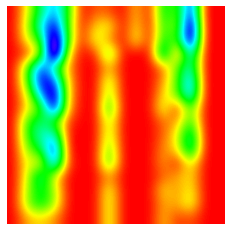

Encoded 68  Label Calcific


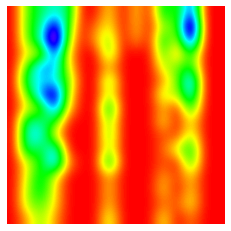

Encoded 69  Label Calcific


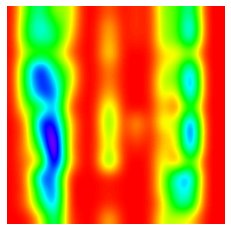

Encoded 70  Label Calcific


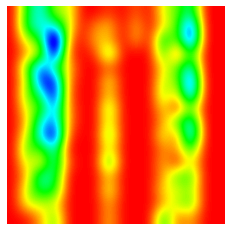

Encoded 71  Label Calcific


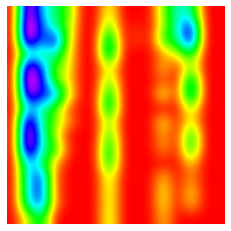

Encoded 72  Label Calcific


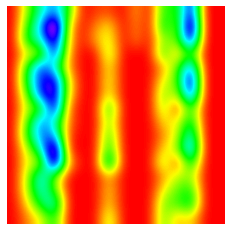

Encoded 73  Label Fibrous


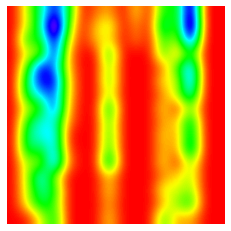

Encoded 74  Label Calcific


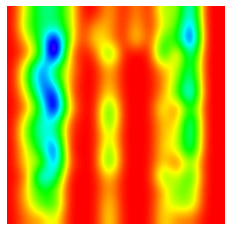

Encoded 75  Label Calcific


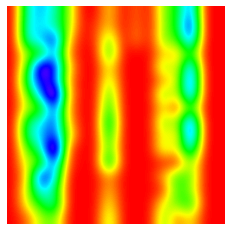

Encoded 76  Label Calcific


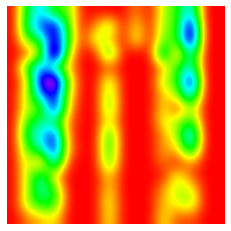

Encoded 77  Label Calcific


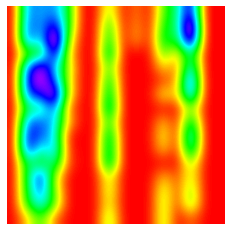

Encoded 78  Label Fibrous


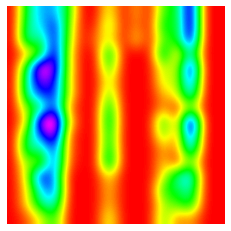

Encoded 79  Label Calcific


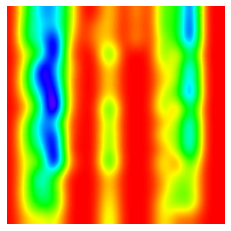

Encoded 80  Label Calcific


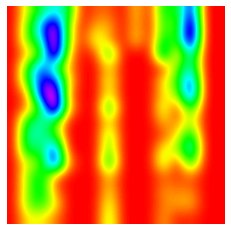

Encoded 81  Label Calcific


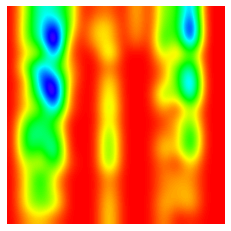

Encoded 82  Label Fibrous


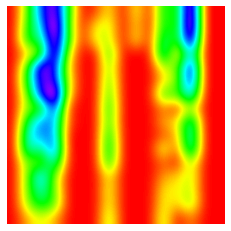

Encoded 83  Label Calcific


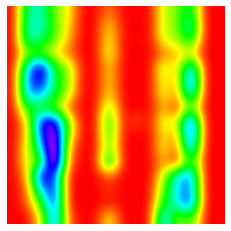

Encoded 84  Label Calcific


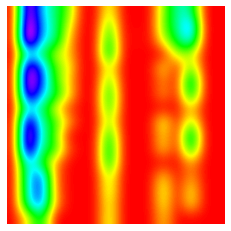

Encoded 85  Label Calcific


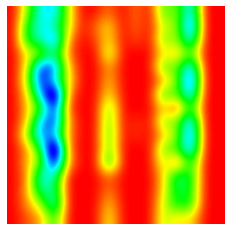

Encoded 86  Label Calcific


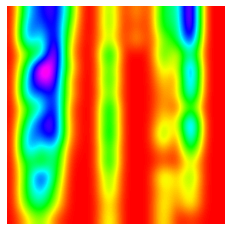

Encoded 87  Label Calcific


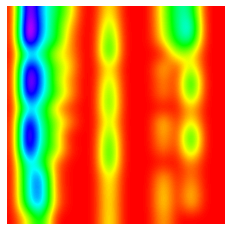

Encoded 88  Label Calcific


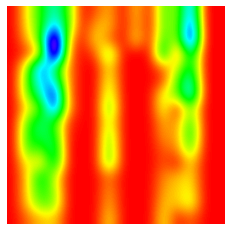

Encoded 89  Label Fibrous


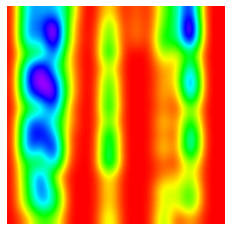

Encoded 90  Label Calcific


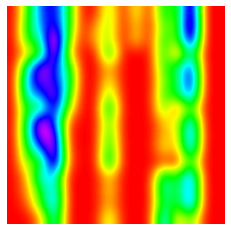

Encoded 91  Label Fibrous


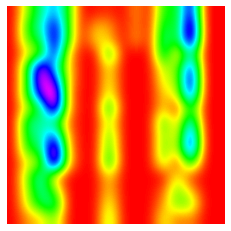

Encoded 92  Label Fibrous


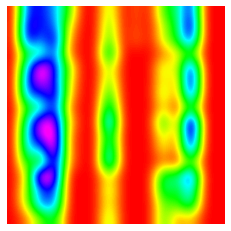

Encoded 93  Label Calcific


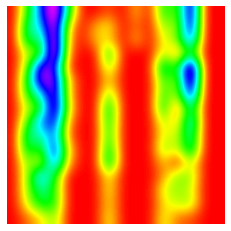

Encoded 94  Label Calcific


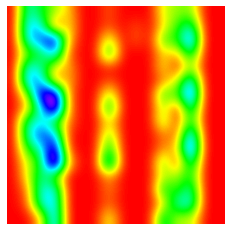

Encoded 95  Label Fibrous


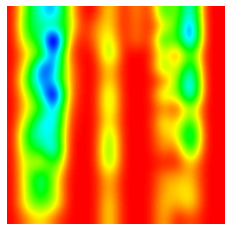

Encoded 96  Label Fibrous


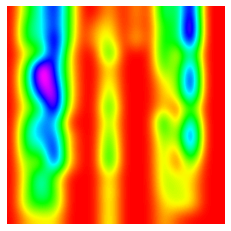

Encoded 97  Label Calcific


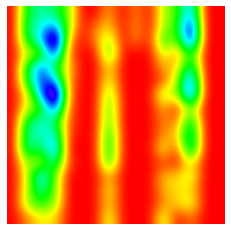

Encoded 98  Label Fibrous


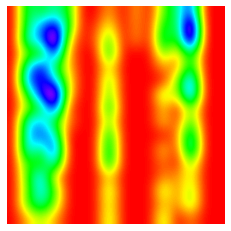

Encoded 99  Label Calcific


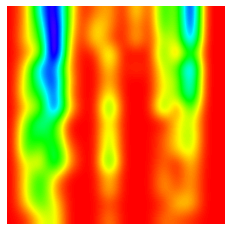

In [49]:
print(len(train_img))
    
for i in range(100):
    print("Encoded", i, " Label", label_conv[y_test[i]])
    img = encoded_imgs[i].reshape((16, 16))
    #fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(4, 4),subplot_kw={'xticks': [], 'yticks': []})  
    #print('original:')
    #plt.imshow(img)
    #plt.show()
    img_name = train_img[i].split('/')[-1].replace('.png', '') 
    #print(img_name)
    interpolation_method = 'bicubic'
    plt.axis('off')
    plt.imshow(img, interpolation = interpolation_method, cmap = 'hsv')
    plt.savefig(f'dataset/Filters/hsv/{img_name}_{interpolation_method}.png')
    plt.show()


Encoded 0  Label Calcific


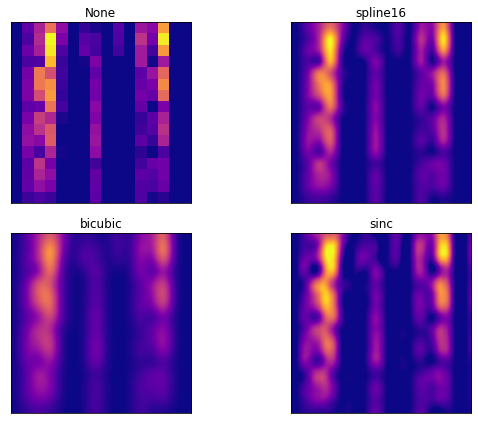




Encoded 1  Label Calcific


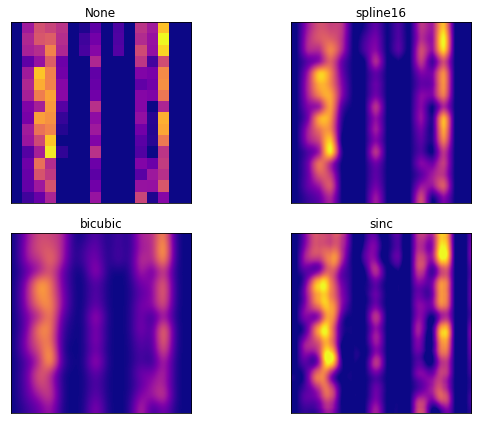




Encoded 2  Label Fibrous


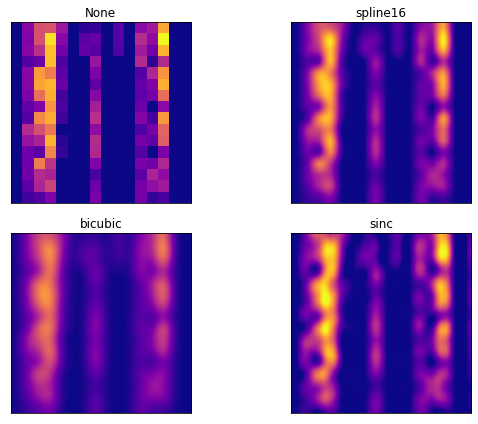




Encoded 3  Label Fibrous


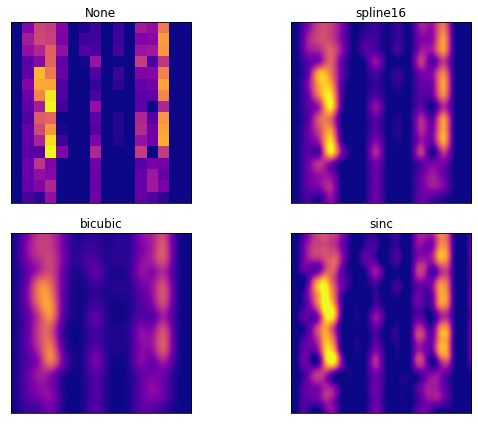




Encoded 4  Label Calcific


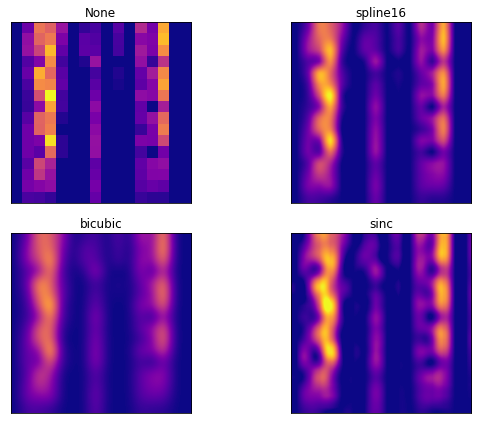




Encoded 5  Label Fibrous


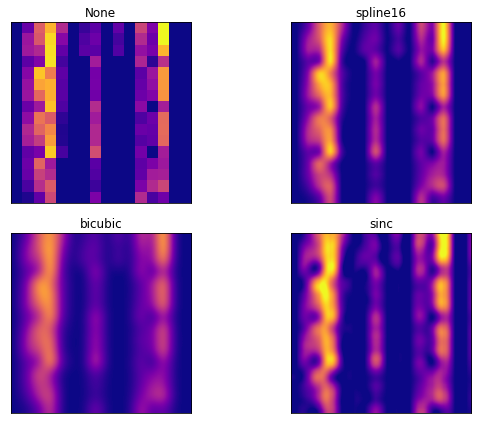




Encoded 6  Label Calcific


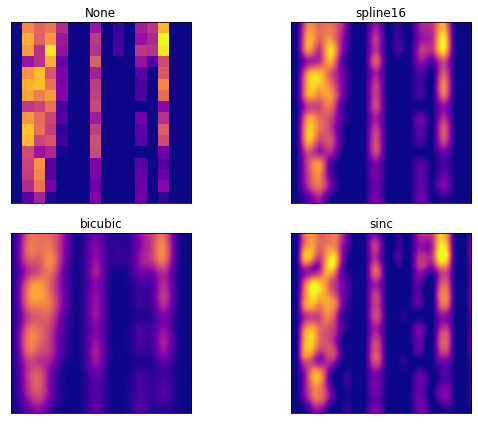




Encoded 7  Label Calcific


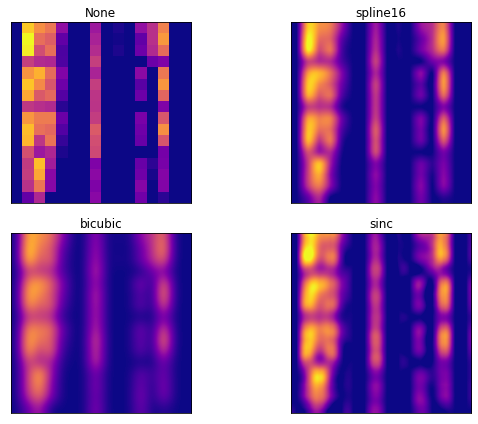




Encoded 8  Label Calcific


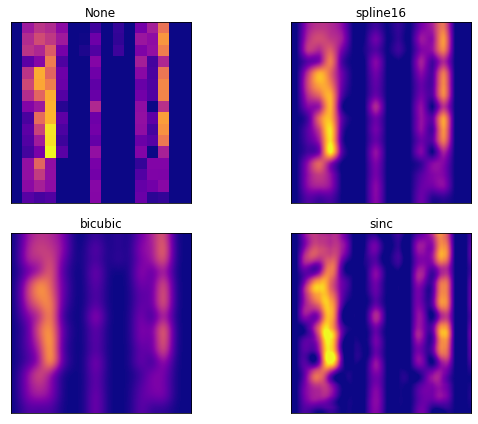




Encoded 9  Label Calcific


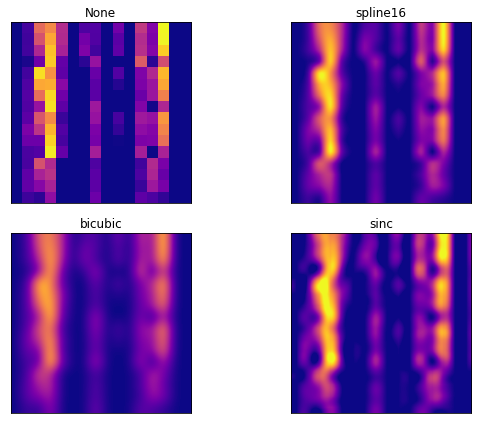




Encoded 10  Label Fibrous


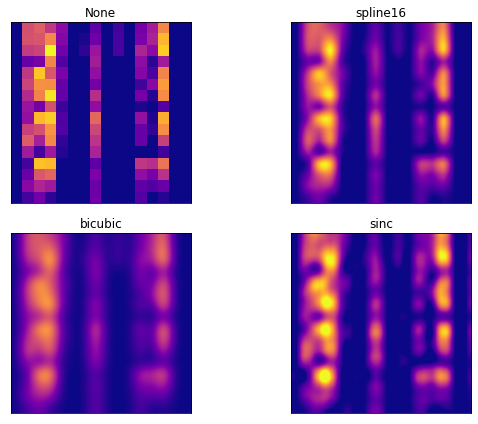




Encoded 11  Label Fibrous


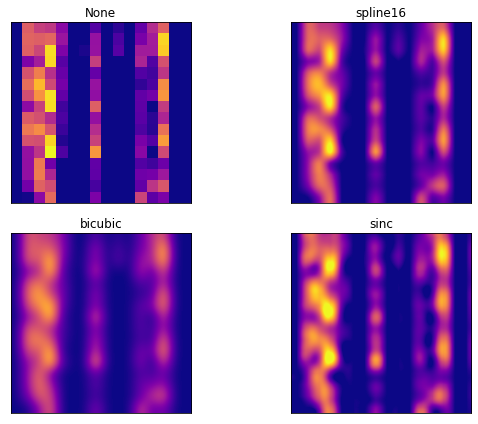




Encoded 12  Label Fibrous


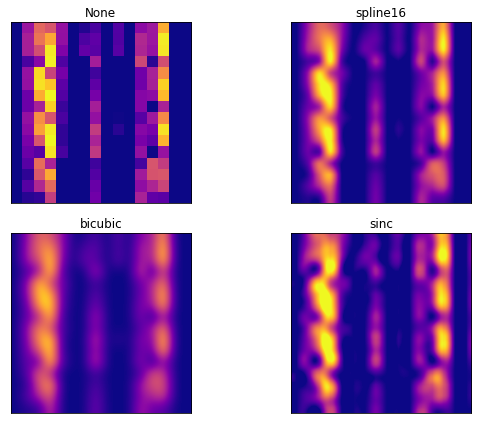




Encoded 13  Label Fibrous


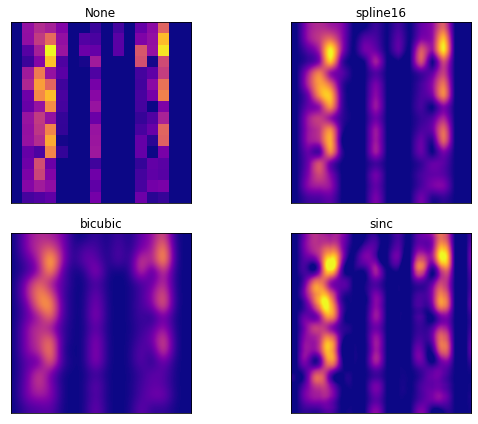




Encoded 14  Label Fibrous


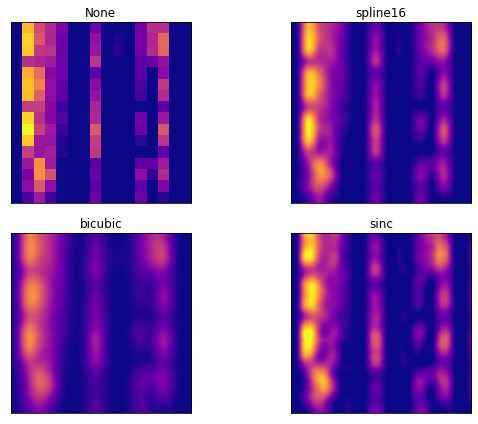




Encoded 15  Label Calcific


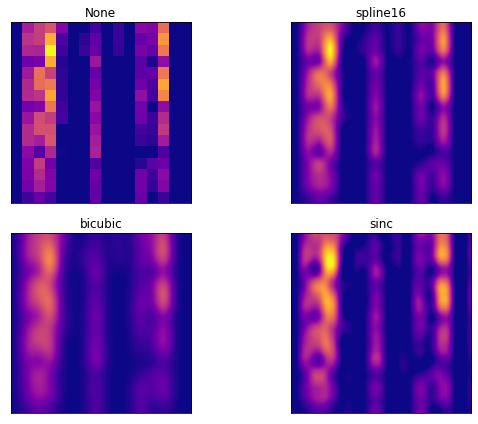




Encoded 16  Label Calcific


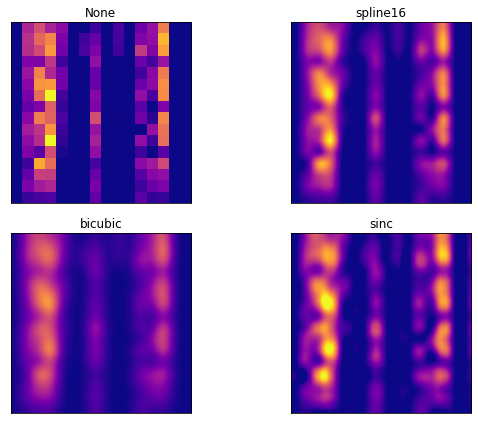




Encoded 17  Label Fibrous


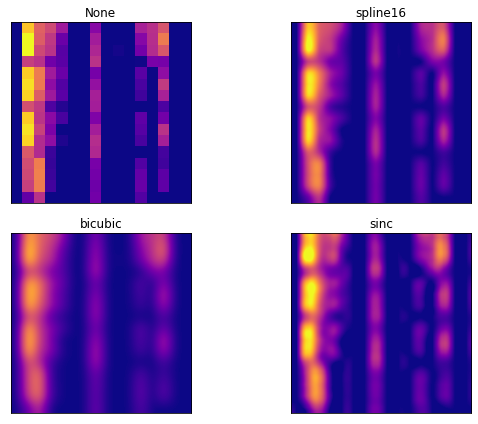




Encoded 18  Label Fibrous


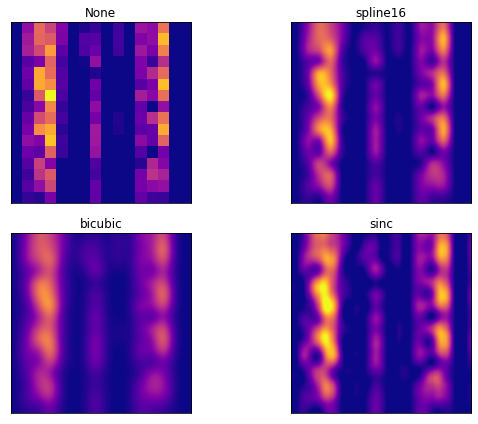




Encoded 19  Label Calcific


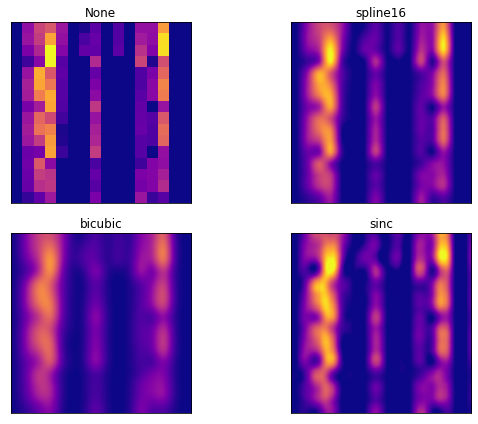




Encoded 20  Label Calcific


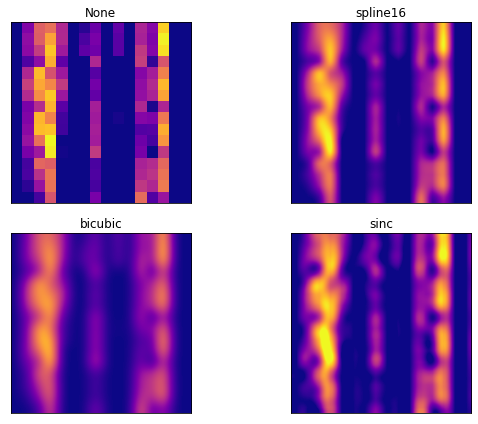




Encoded 21  Label Calcific


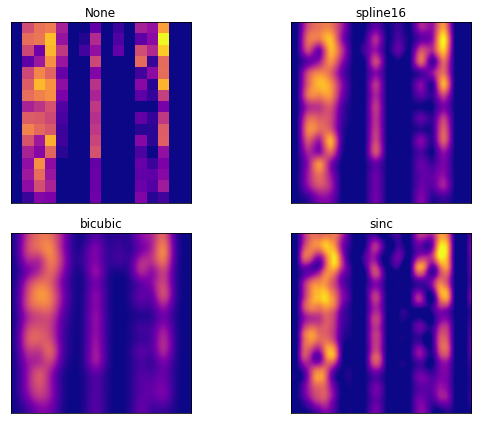




Encoded 22  Label Calcific


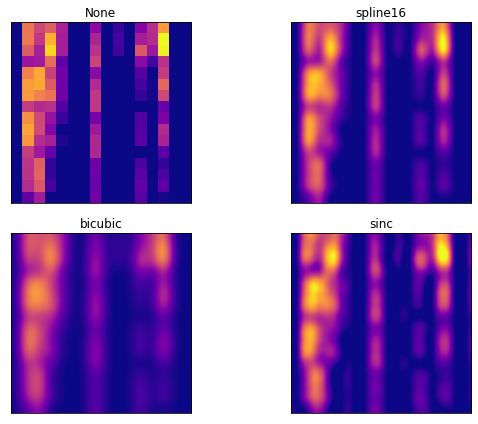




Encoded 23  Label Calcific


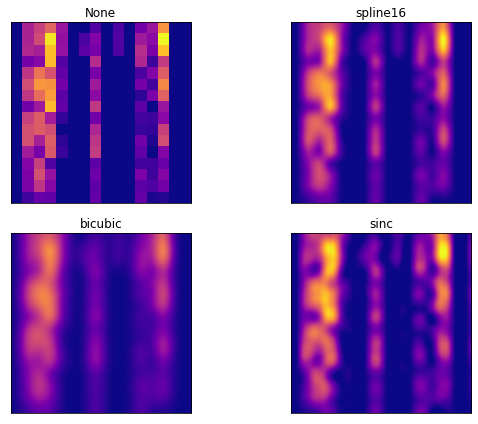




Encoded 24  Label Calcific


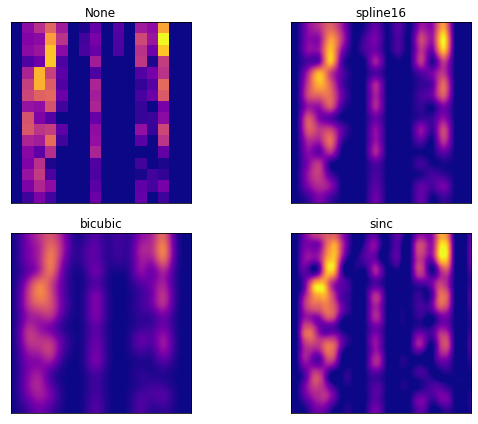




Encoded 25  Label Calcific


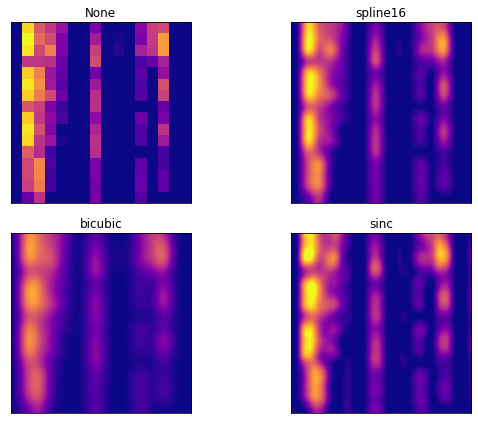




Encoded 26  Label Fibrous


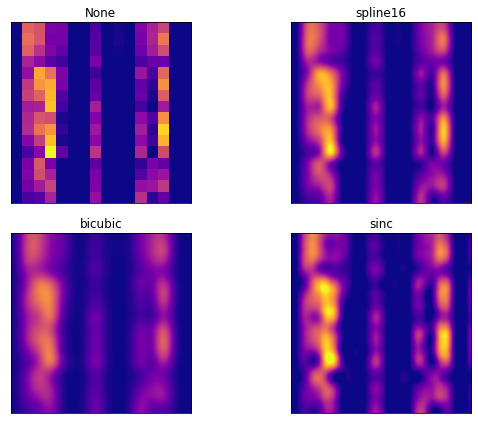




Encoded 27  Label Fibrous


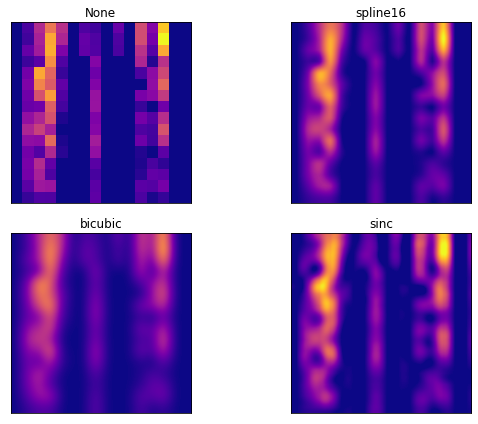




Encoded 28  Label Calcific


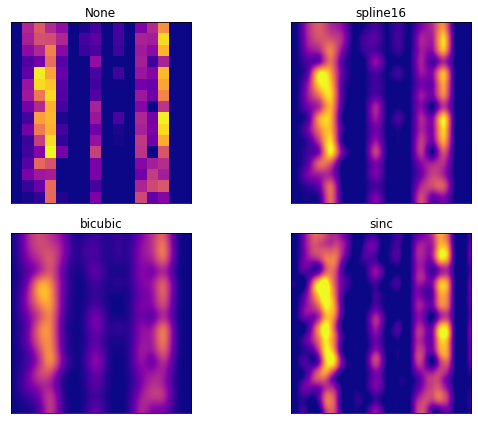




Encoded 29  Label Calcific


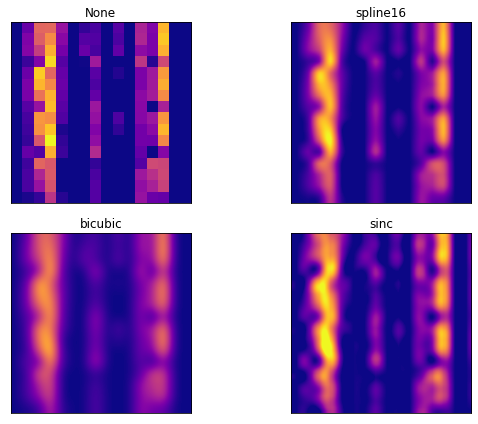




Encoded 30  Label Calcific


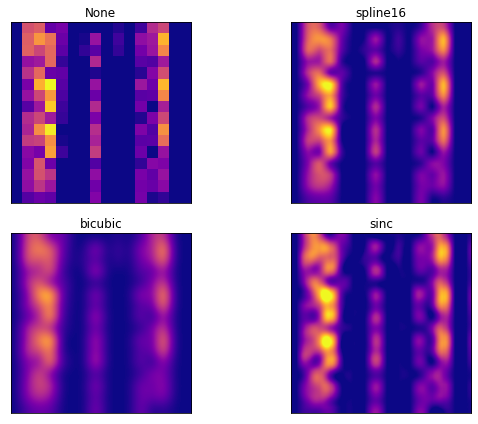




Encoded 31  Label Calcific


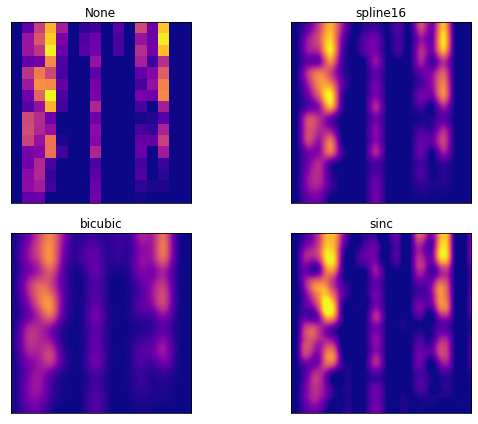




Encoded 32  Label Fibrous


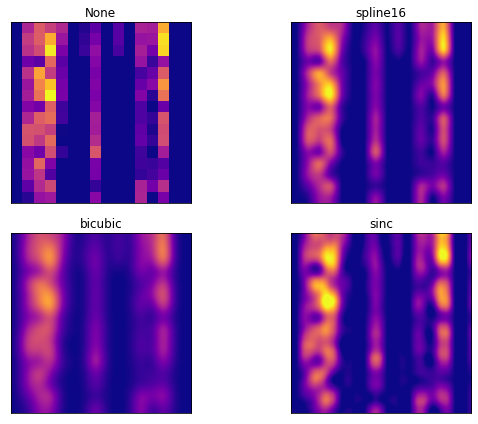




Encoded 33  Label Fibrous


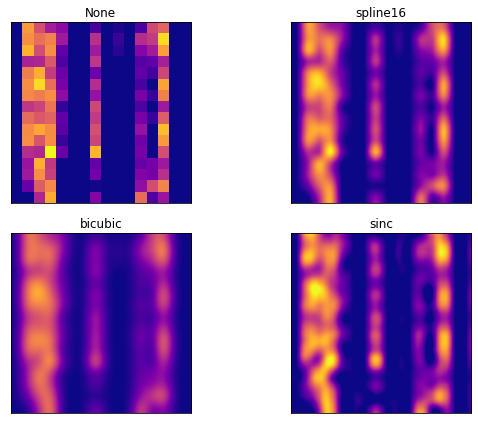




Encoded 34  Label Fibrous


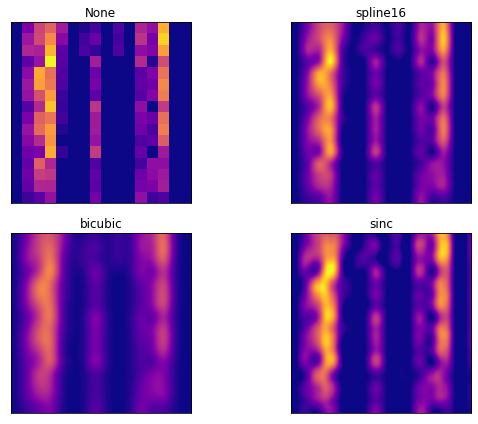




Encoded 35  Label Calcific


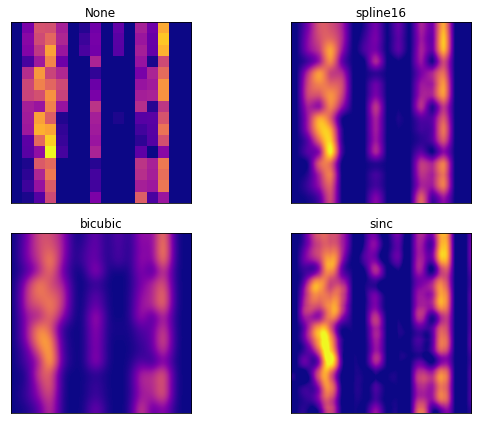




Encoded 36  Label Calcific


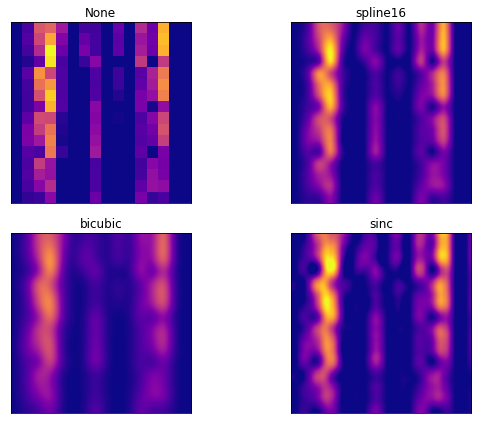




Encoded 37  Label Fibrous


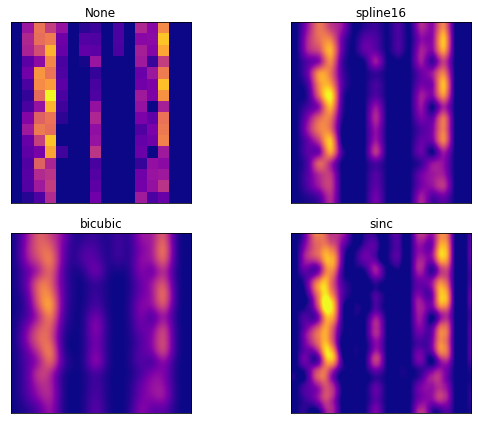




Encoded 38  Label Calcific


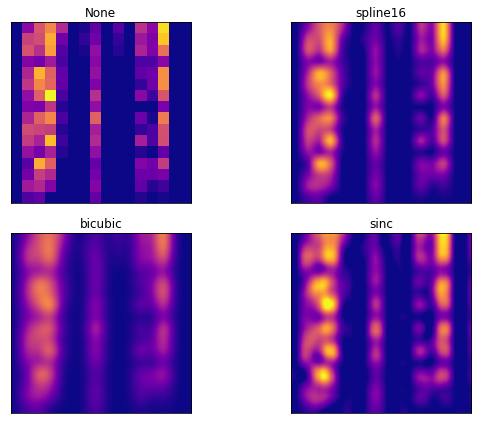




Encoded 39  Label Calcific


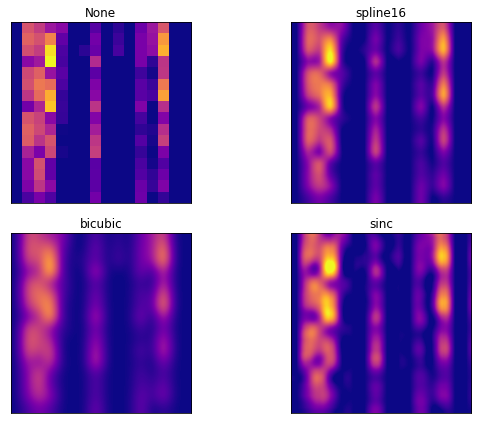




Encoded 40  Label Calcific


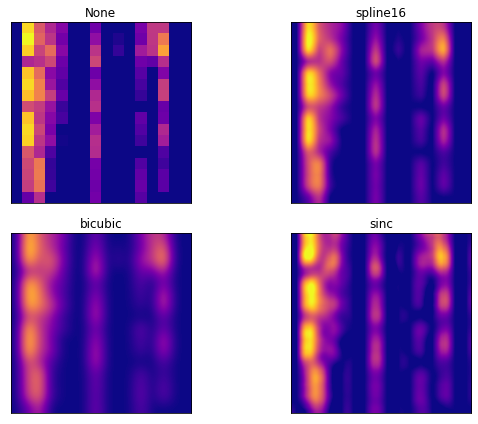




Encoded 41  Label Calcific


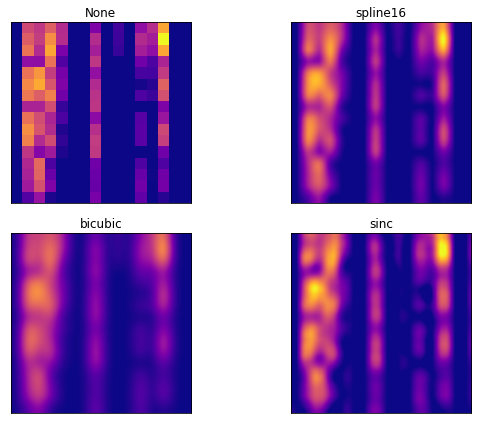




Encoded 42  Label Fibrous


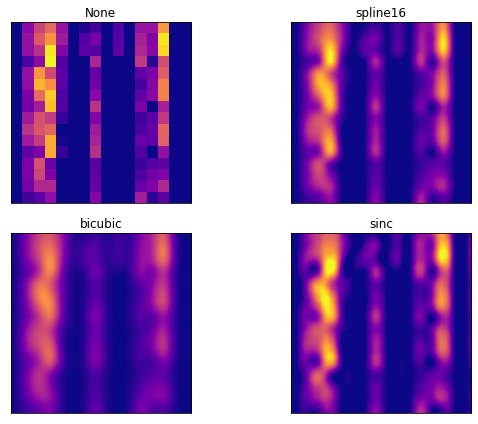




Encoded 43  Label Calcific


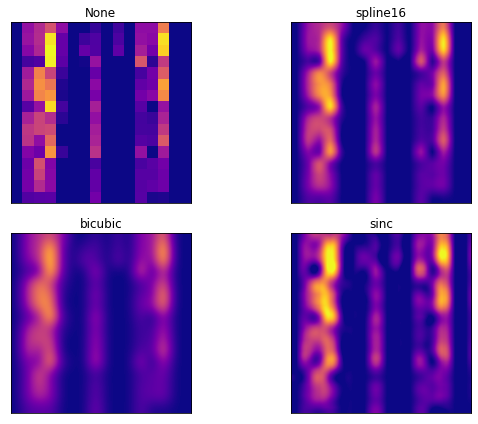




Encoded 44  Label Calcific


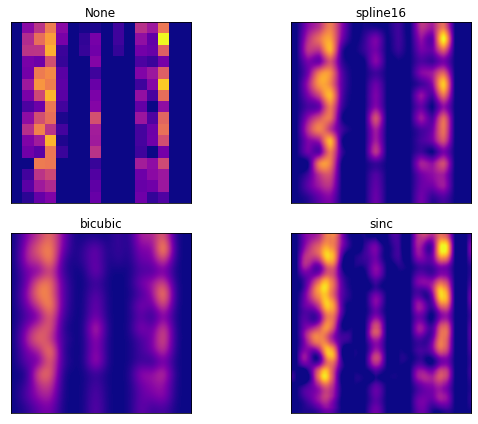




Encoded 45  Label Calcific


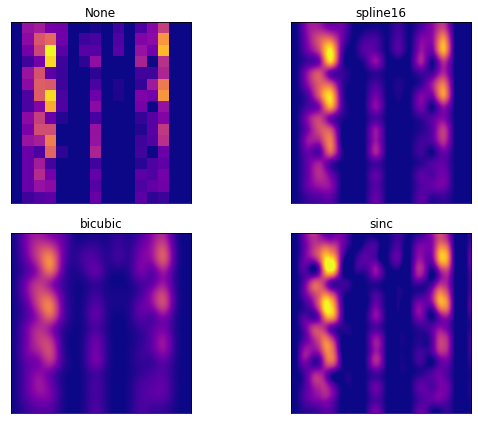




Encoded 46  Label Calcific


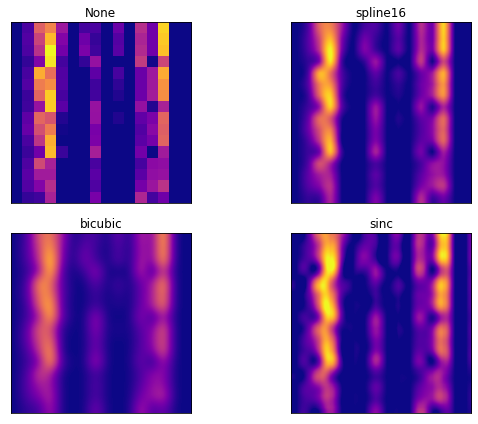




Encoded 47  Label Fibrous


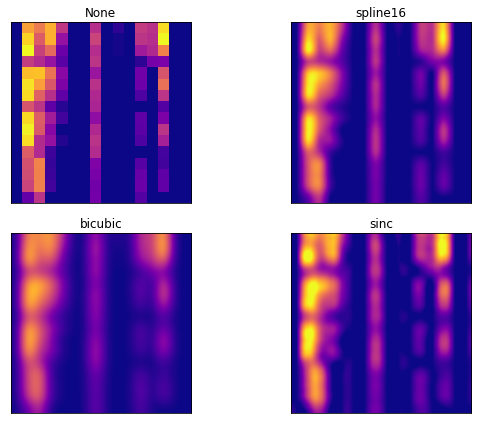




Encoded 48  Label Calcific


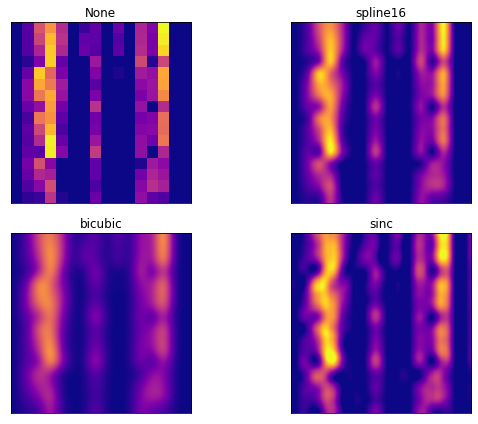




Encoded 49  Label Fibrous


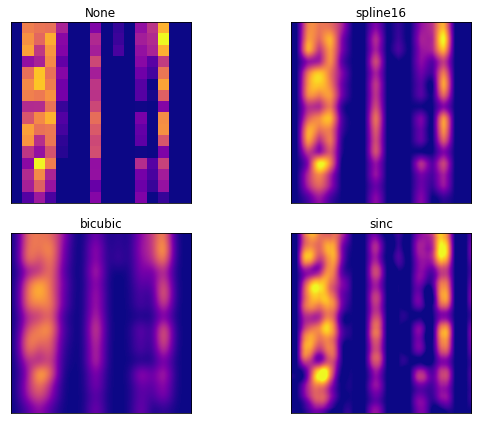




Encoded 50  Label Calcific


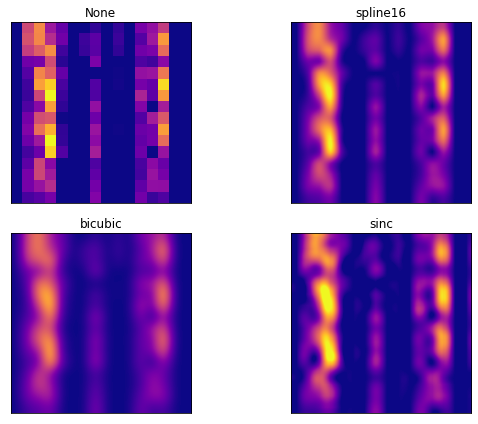




Encoded 51  Label Calcific


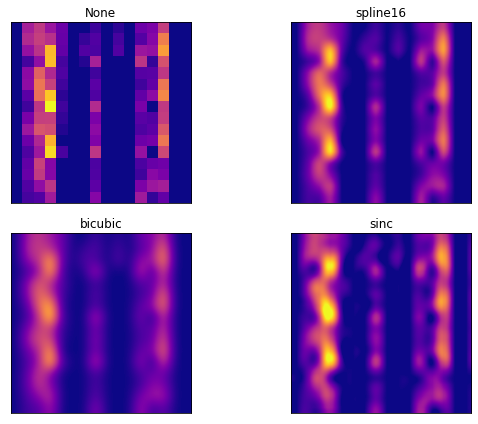




Encoded 52  Label Fibrous


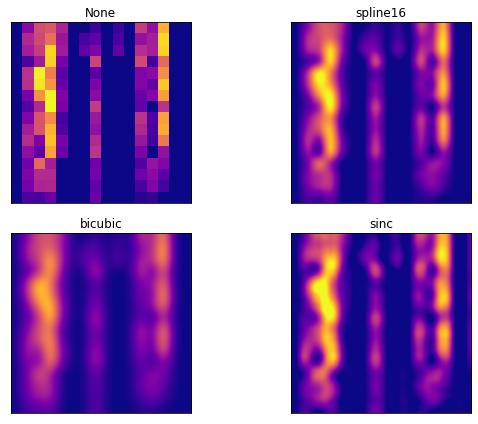




Encoded 53  Label Calcific


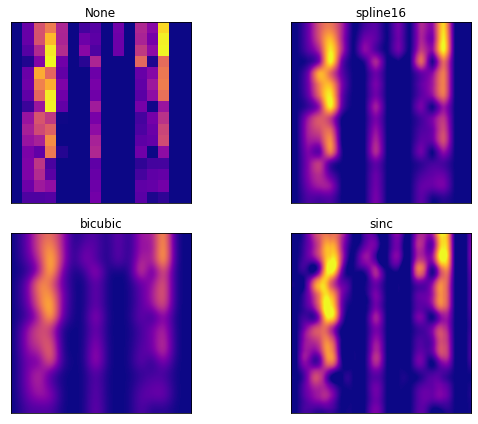




Encoded 54  Label Calcific


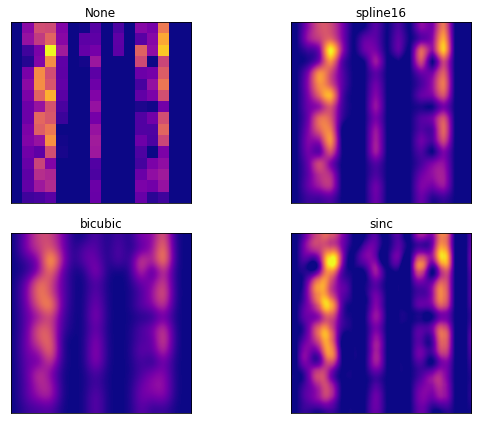




Encoded 55  Label Fibrous


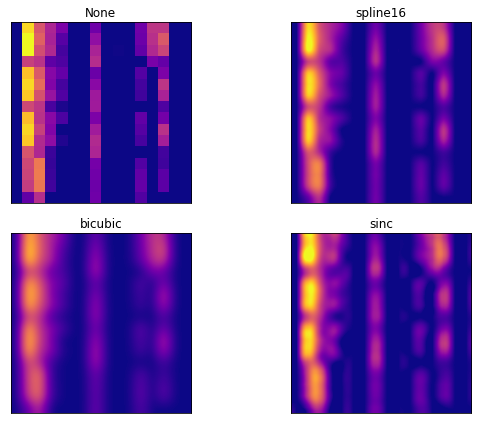




Encoded 56  Label Calcific


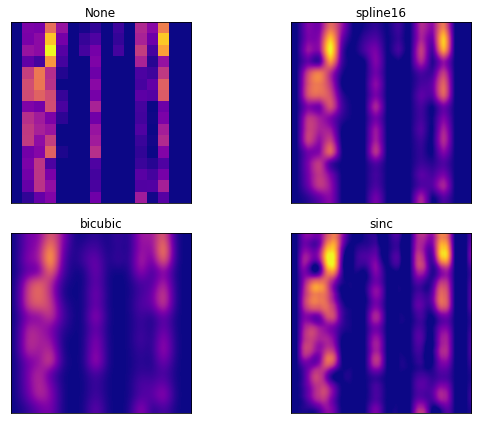




Encoded 57  Label Fibrous


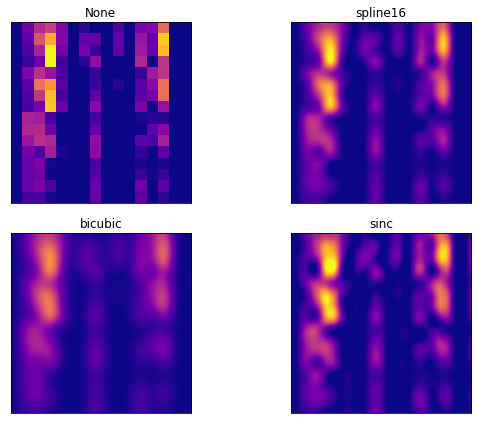




Encoded 58  Label Calcific


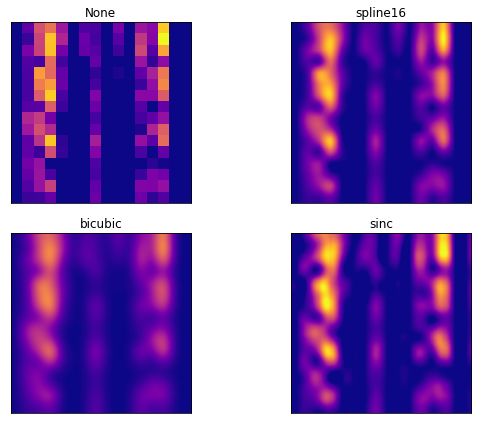




Encoded 59  Label Calcific


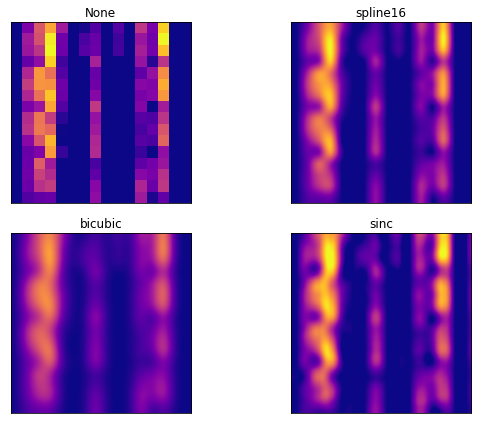




Encoded 60  Label Fibrous


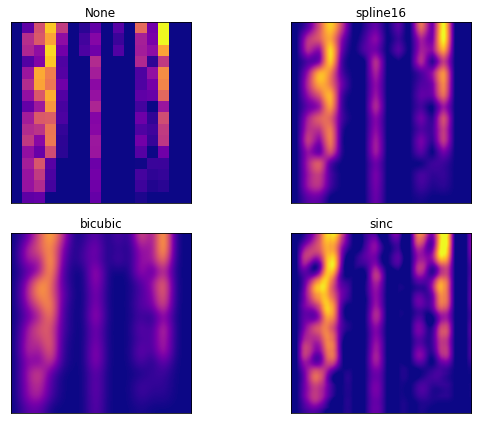




Encoded 61  Label Fibrous


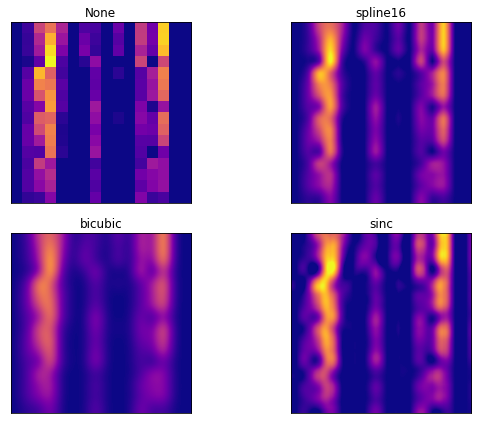




Encoded 62  Label Fibrous


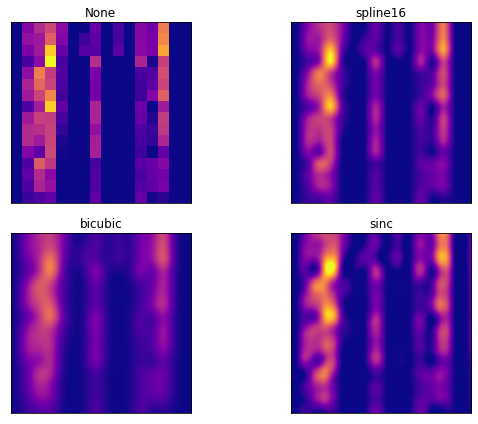




Encoded 63  Label Fibrous


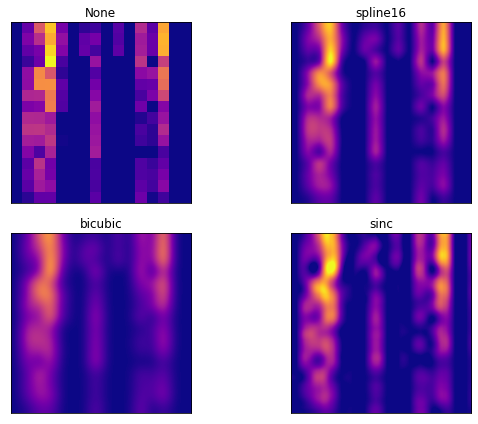




Encoded 64  Label Fibrous


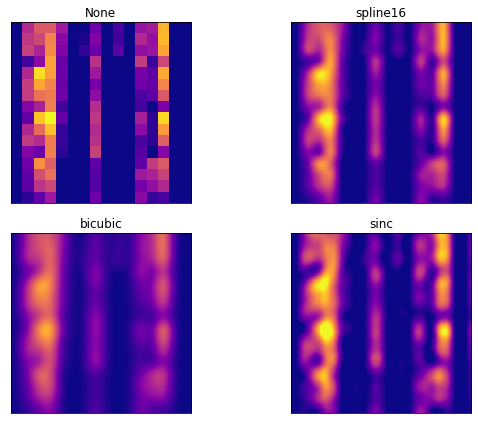




Encoded 65  Label Calcific


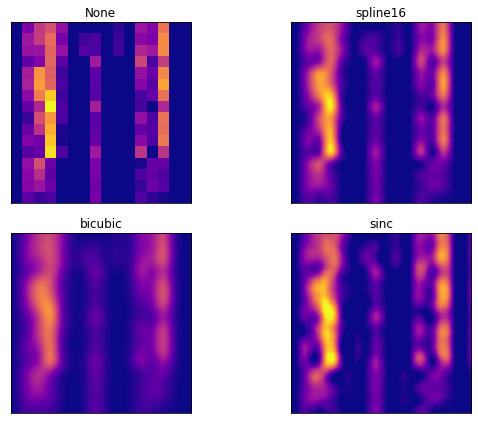




Encoded 66  Label Calcific


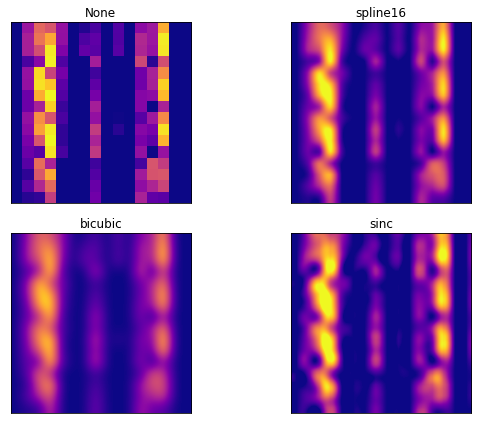




Encoded 67  Label Fibrous


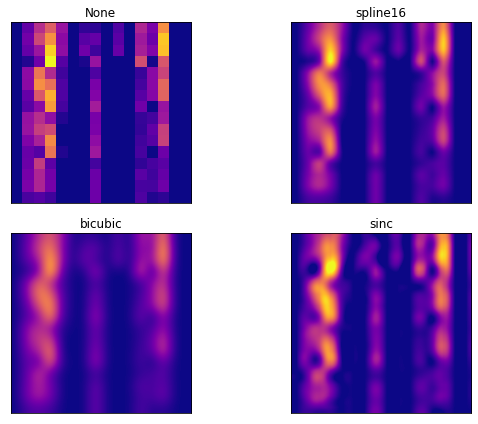




Encoded 68  Label Calcific


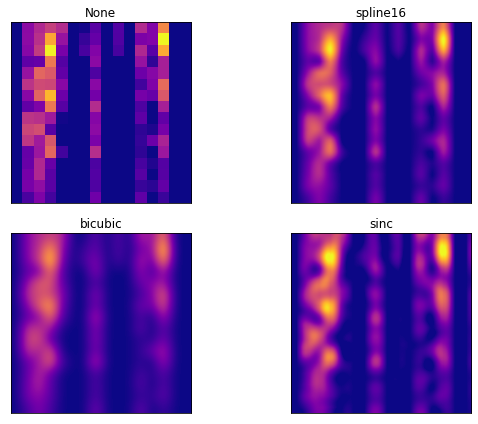




Encoded 69  Label Calcific


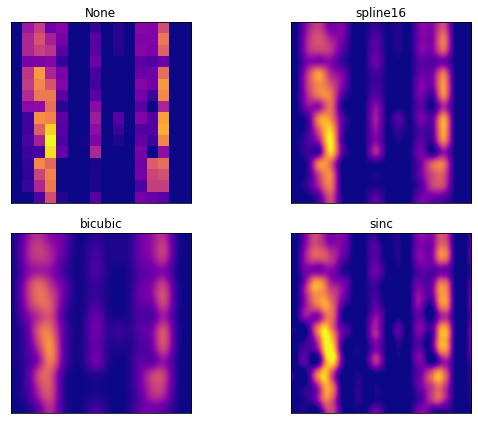




Encoded 70  Label Calcific


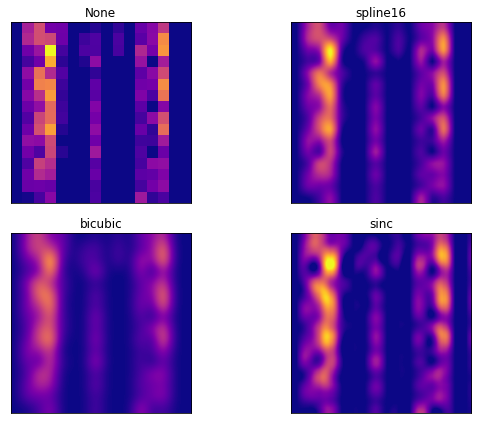




Encoded 71  Label Calcific


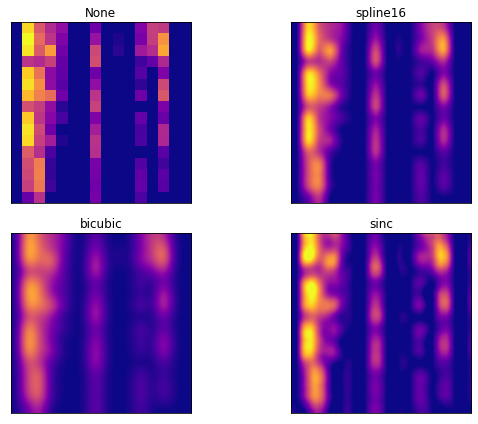




Encoded 72  Label Calcific


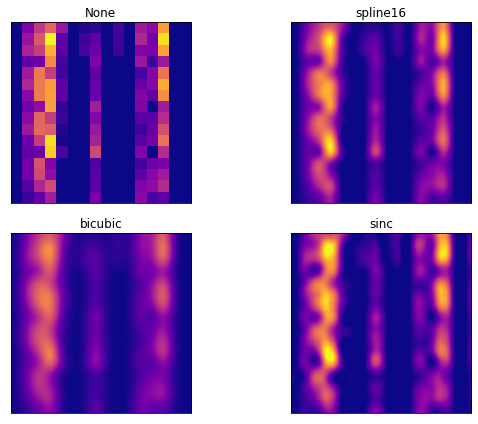




Encoded 73  Label Fibrous


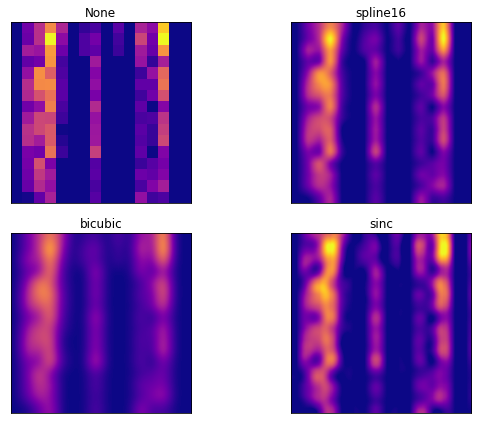




Encoded 74  Label Calcific


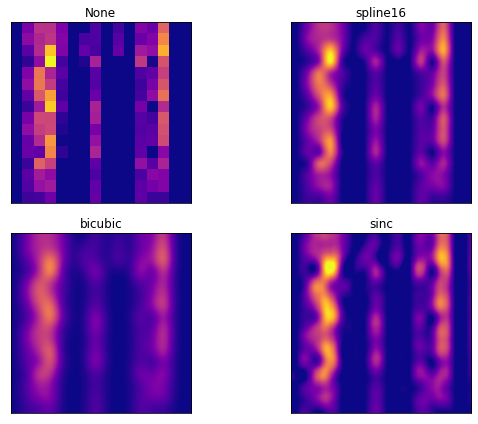




Encoded 75  Label Calcific


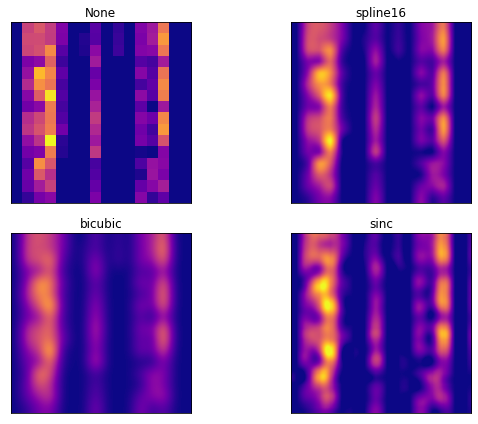




Encoded 76  Label Calcific


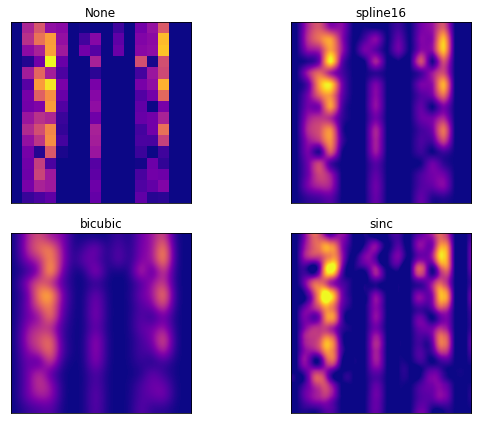




Encoded 77  Label Calcific


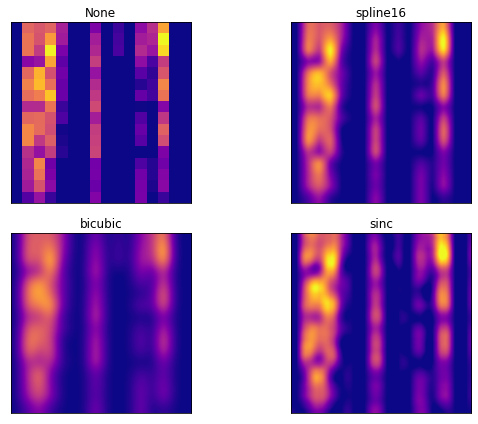




Encoded 78  Label Fibrous


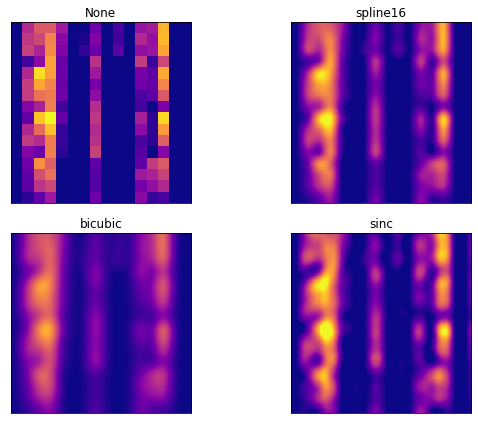




Encoded 79  Label Calcific


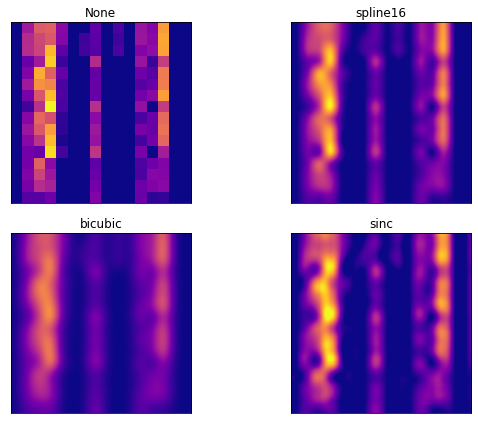




Encoded 80  Label Calcific


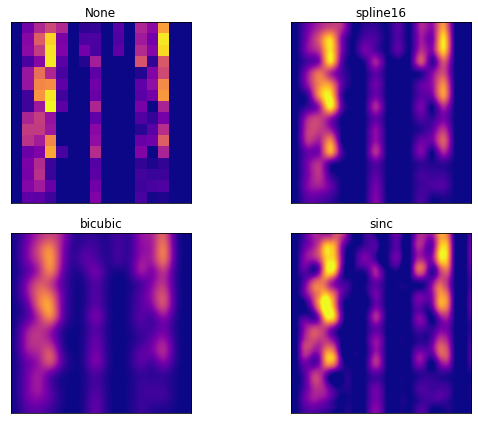




Encoded 81  Label Calcific


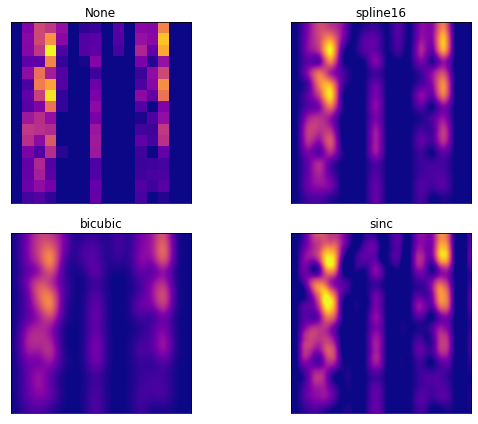




Encoded 82  Label Fibrous


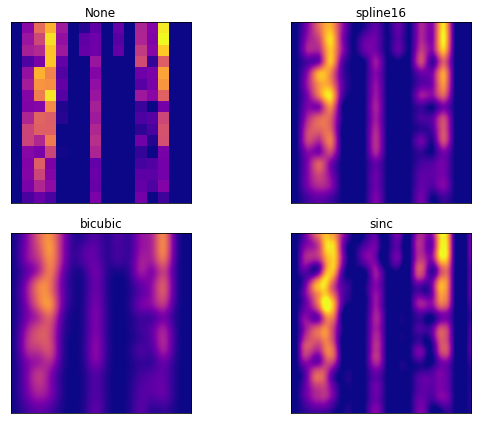




Encoded 83  Label Calcific


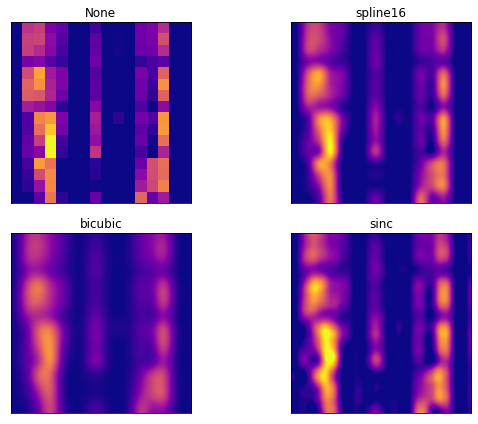




Encoded 84  Label Calcific


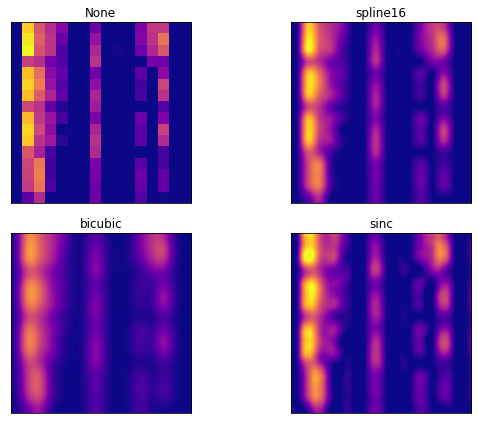




Encoded 85  Label Calcific


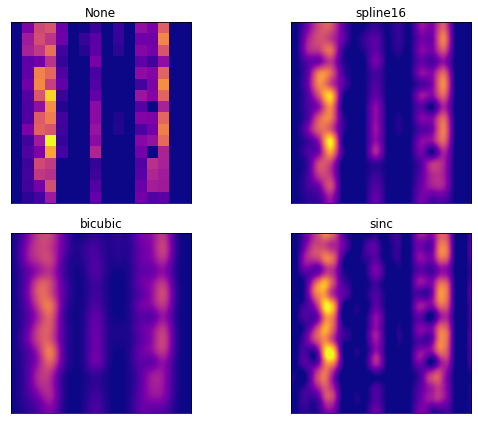




Encoded 86  Label Calcific


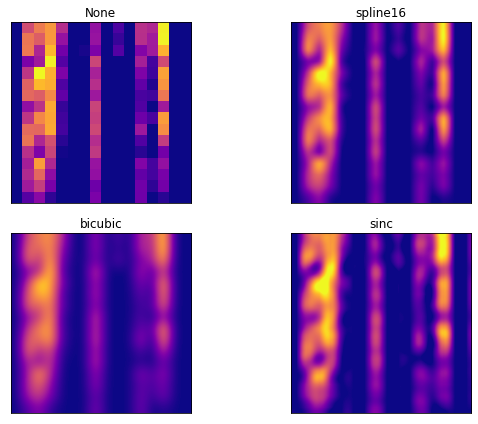




Encoded 87  Label Calcific


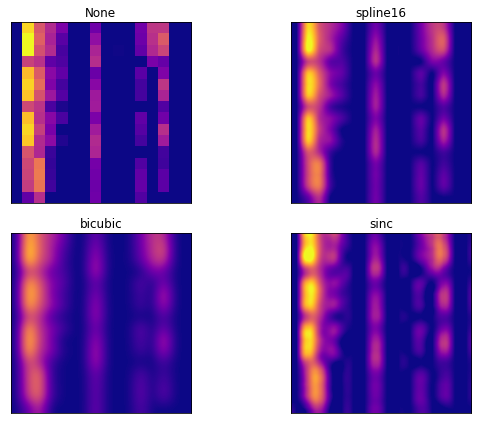




Encoded 88  Label Calcific


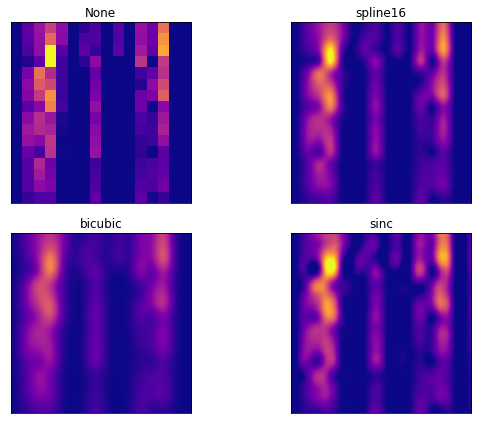




Encoded 89  Label Fibrous


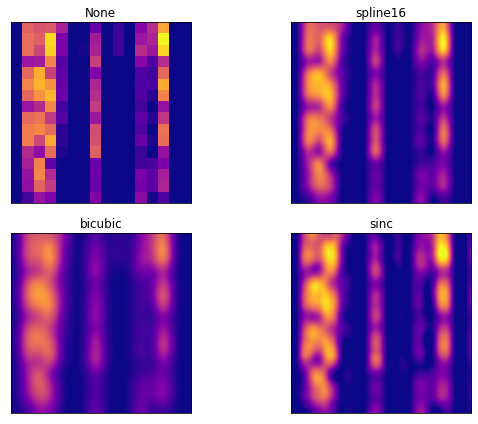




Encoded 90  Label Calcific


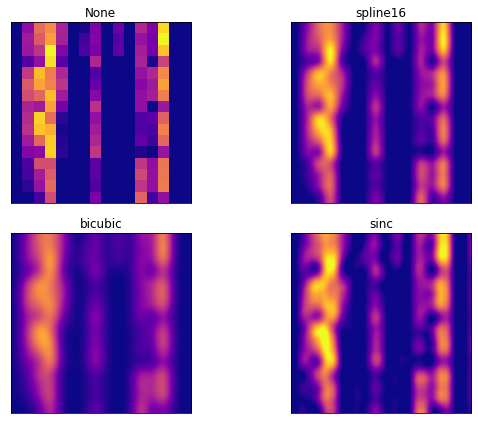




Encoded 91  Label Fibrous


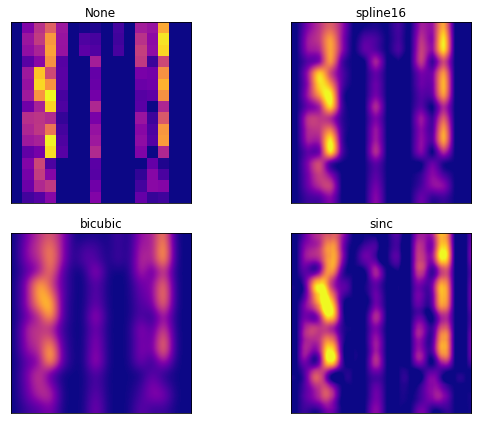




Encoded 92  Label Fibrous


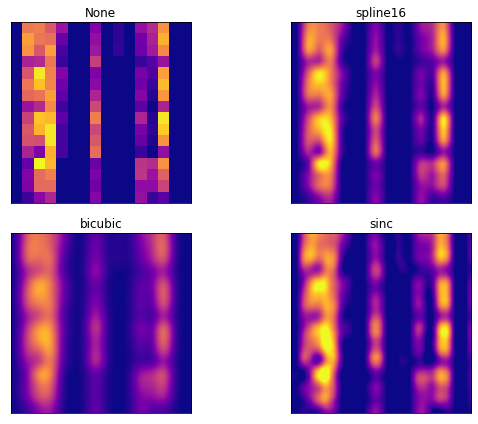




Encoded 93  Label Calcific


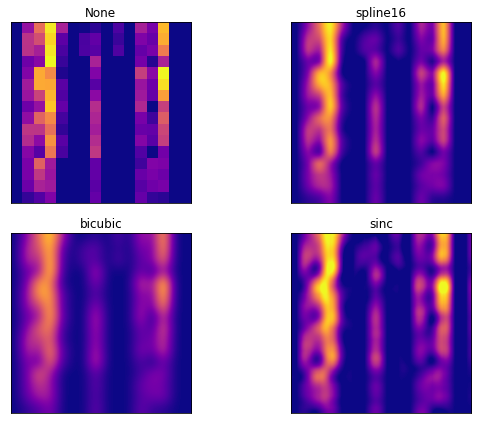




Encoded 94  Label Calcific


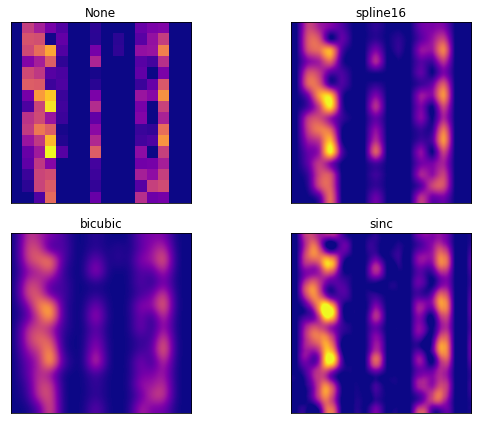




Encoded 95  Label Fibrous


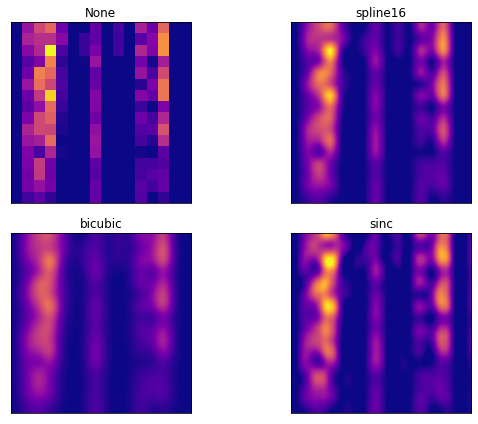




Encoded 96  Label Fibrous


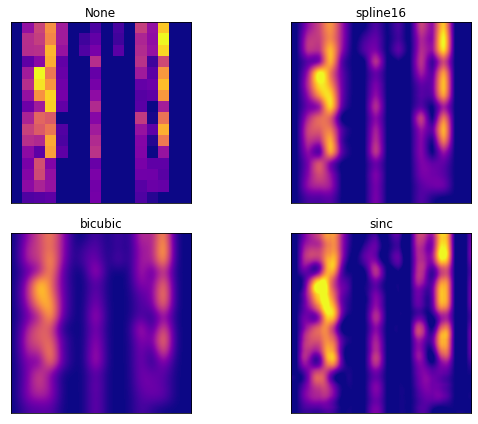




Encoded 97  Label Calcific


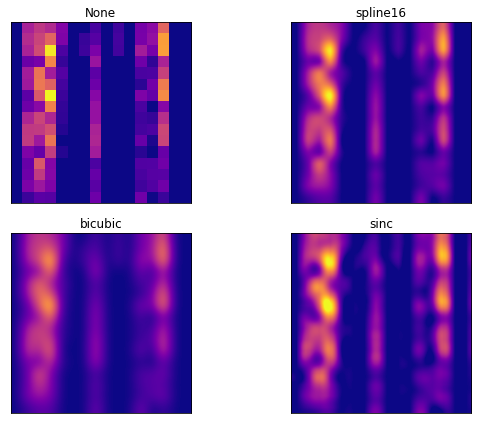




Encoded 98  Label Fibrous


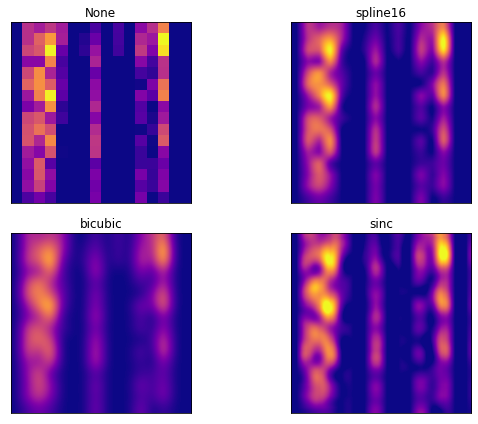




Encoded 99  Label Calcific


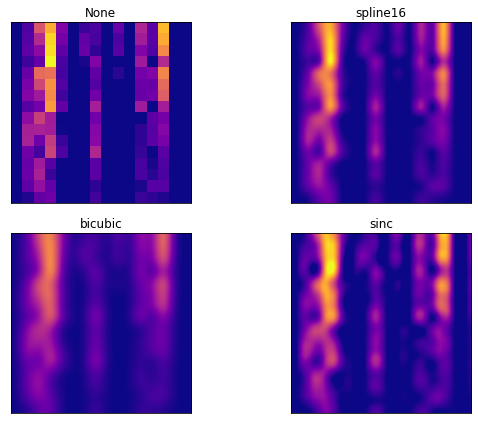

In [50]:
methods = [None, 'spline16', 'bicubic', 'sinc']

for i in range(100):
    print("Encoded", i, " Label", label_conv[y_test[i]],)
    
    img = encoded_imgs[i].reshape((16, 16))

    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(9, 6),
                            subplot_kw={'xticks': [], 'yticks': []})

    for ax, interp_method in zip(axs.flat, methods):
        ax.imshow(img, interpolation=interp_method, cmap = 'plasma')
        
        ax.set_title(str(interp_method))

    plt.tight_layout()
    plt.show()
    
    print('\n\n')


In [51]:
import pandas as pd 
data = [[0,0,0,"test"] for _ in range (250)]
for index, fn in enumerate(os.listdir('dataset/Filters/hsv/')[:250]):
    img = plt.imread(os.path.join('dataset/Filters/hsv/', fn))
    for i in img:
        red_content = 0 
        blue_content = 0 
        green_content = 0
        for j in i: 
            r = j[0]
            b = j[1]
            g = j[2]
            if (b!= g and g != r and r != b):
                if (b > r and b > g):
                    blue_content += 1 

                if (r > b and r > g):
                    red_content += 1 

                if (g > r and g > b):
                    green_content += 1  
                    
                data[index] = [red_content, green_content, blue_content, label_conv[y_test[index]]]
            
    percent_complete = index/250*100
    print("percent complete: ", percent_complete)
    print("data values: ", data[index])
            
df = pd.DataFrame(data, columns = ['Red', 'Green', 'Blue','Name']) 
df


percent complete:  0.0
data values:  [47, 25, 97, 'Calcific']
percent complete:  0.4
data values:  [144, 0, 13, 'Calcific']
percent complete:  0.8
data values:  [63, 2, 84, 'Fibrous']
percent complete:  1.2
data values:  [61, 63, 33, 'Fibrous']
percent complete:  1.6
data values:  [132, 0, 46, 'Calcific']
percent complete:  2.0
data values:  [36, 26, 96, 'Fibrous']
percent complete:  2.4
data values:  [44, 36, 65, 'Calcific']
percent complete:  2.8000000000000003
data values:  [84, 0, 86, 'Calcific']
percent complete:  3.2
data values:  [169, 0, 7, 'Calcific']
percent complete:  3.5999999999999996
data values:  [153, 0, 21, 'Calcific']
percent complete:  4.0
data values:  [74, 9, 66, 'Fibrous']
percent complete:  4.3999999999999995
data values:  [75, 0, 102, 'Fibrous']
percent complete:  4.8
data values:  [107, 0, 47, 'Fibrous']
percent complete:  5.2
data values:  [71, 26, 87, 'Fibrous']
percent complete:  5.6000000000000005
data values:  [112, 0, 50, 'Fibrous']
percent complete:  6.0

percent complete:  50.4
data values:  [40, 42, 82, 'Calcific']
percent complete:  50.8
data values:  [101, 0, 68, 'Fibrous']
percent complete:  51.2
data values:  [68, 39, 81, 'Calcific']
percent complete:  51.6
data values:  [109, 0, 60, 'Calcific']
percent complete:  52.0
data values:  [65, 0, 108, 'Calcific']
percent complete:  52.400000000000006
data values:  [35, 75, 55, 'Calcific']
percent complete:  52.800000000000004
data values:  [90, 0, 88, 'Fibrous']
percent complete:  53.2
data values:  [76, 11, 72, 'Calcific']
percent complete:  53.6
data values:  [60, 40, 58, 'Fibrous']
percent complete:  54.0
data values:  [149, 0, 0, 'Fibrous']
percent complete:  54.400000000000006
data values:  [62, 42, 50, 'Fibrous']
percent complete:  54.800000000000004
data values:  [170, 0, 0, 'Calcific']
percent complete:  55.2
data values:  [63, 0, 100, 'Fibrous']
percent complete:  55.60000000000001
data values:  [35, 37, 73, 'Fibrous']
percent complete:  56.00000000000001
data values:  [104, 0,

,Red,Green,Blue,Name
0,47,25,97,Calcific
1,144,0,13,Calcific
2,63,2,84,Fibrous
3,61,63,33,Fibrous
4,132,0,46,Calcific
5,36,26,96,Fibrous
6,44,36,65,Calcific
7,84,0,86,Calcific
8,169,0,7,Calcific
9,153,0,21,Calcific


In [52]:
df

,Red,Green,Blue,Name
0,47,25,97,Calcific
1,144,0,13,Calcific
2,63,2,84,Fibrous
3,61,63,33,Fibrous
4,132,0,46,Calcific
5,36,26,96,Fibrous
6,44,36,65,Calcific
7,84,0,86,Calcific
8,169,0,7,Calcific
9,153,0,21,Calcific


In [53]:
from sklearn.preprocessing import StandardScaler
features = ['Red', 'Green', 'Blue']
# Separating out the features
x = df.loc[:, features].values
# Separating out the target
y = df.loc[:,['Name']].values
# Standardizing the features
x = StandardScaler().fit_transform(x)

In [54]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

In [55]:
pca.explained_variance_ratio_

array([0.71584338, 0.25576005])

In [56]:
finalDf = pd.concat([principalDf, df[['Name']]], axis = 1)

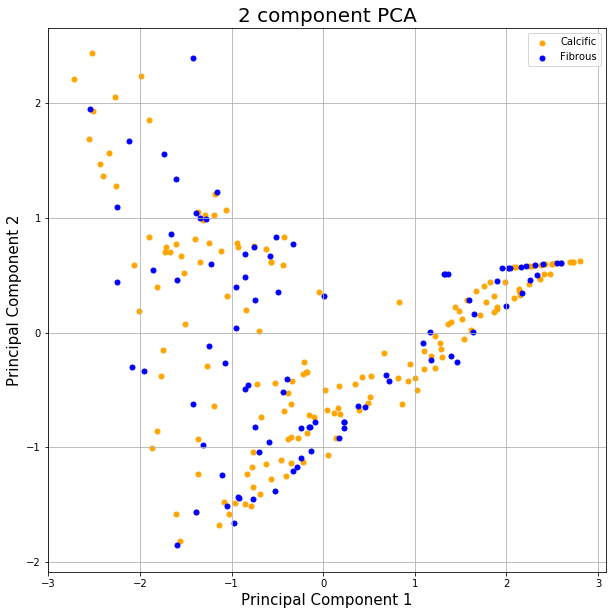

In [58]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = ['Calcific', 'Fibrous']
colors = ['orange', 'blue']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Name'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1'], finalDf.loc[indicesToKeep, 'principal component 2'],c = color , s = 25)
ax.legend(targets)
ax.grid()